This tutorial is created by Juhee Bae to instruct "Explainable AI". Refer to the lecture and the code provided on Canvas. Do not share with external venues. Refer to this tutorial to solve the assignment.

## Contents

- [Setup](#Setup-and-overview)

- [Data cleaning](#Data-cleaning)

    - [Categorical variables](#Categorical-variables)

    - [Numerical variables](#Numerical-variables)

- [Grid search and modeling](#Grid-search-and-modeling)

- [Train](#Train-with-best-parameters)

- [Predict](#Predict)

- [Explain model with LIME](#Explain-model-with-LIME)

- [Local explanation](#LIME-Local-explanation-(one-day))

In [2]:
import pandas as pd
import numpy as np
np.random.seed(0)
import matplotlib.pyplot as plt
import seaborn as sb
import plotly.express as px

from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV
import xgboost as xgb

import lime
from lime.lime_tabular import LimeTabularExplainer
import time

# Setup and overview 

[For detailed information](https://archive.ics.uci.edu/ml/datasets/bike+sharing+dataset)

In [3]:
df = pd.read_csv('../data/day-bikesharing.csv',parse_dates=['dteday'],index_col=1) # Load the data

In [4]:
df.shape

(731, 15)

In [5]:
def add_features(df):
    df['year'] = df.index.year # yr exists already
    df['month'] = df.index.month
    df['day'] = df.index.day
    df['dayofweek'] = df.index.dayofweek

2011.Jan.1 is a Saturday.

In [6]:
add_features(df)
df.head(3)

,instant,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,year,month,day,dayofweek
dteday,,,,,,,,,,,,,,,,,,,
2011-01-01,1,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985,2011,1,1,5
2011-01-02,2,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801,2011,1,2,6
2011-01-03,3,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349,2011,1,3,0


## Notice: We select meaningful variables for a better understanding of the SHAP results. 

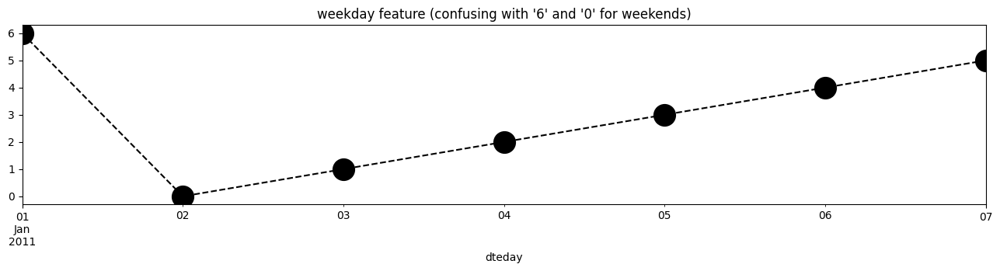

In [7]:
# Let's use 'dayofweek' instead of 'weekday'.
plt.figure(figsize=(16,3))
df['weekday'][:7].plot(linestyle='--', marker='o', color='k', ms=20, 
                       title='weekday feature (confusing with \'6\' and \'0\' for weekends)')
plt.show()

## We will use 'dayofweek' variable when describing each day of a week. Weekends of Saturday and Sunday are 5 and 6. The other weekdays are 0 to 4.

- When analyzing with SHAP, we consider higher numbers of 'dayofweek' feature to show the weekends.

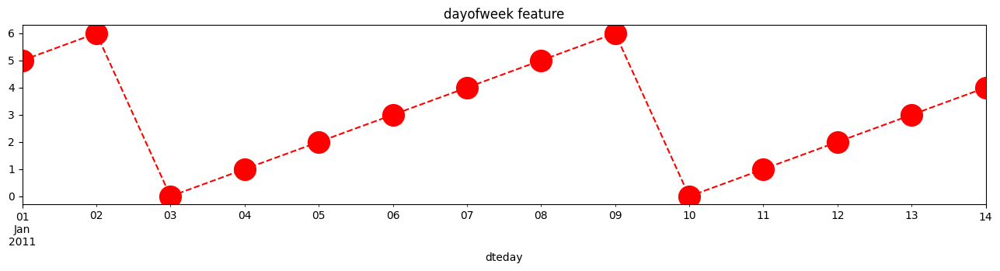

In [8]:
plt.figure(figsize=(16,3))
df['dayofweek'][:14].plot(linestyle='--', marker='o', color='r', ms=20, 
                       title='dayofweek feature')
plt.show()

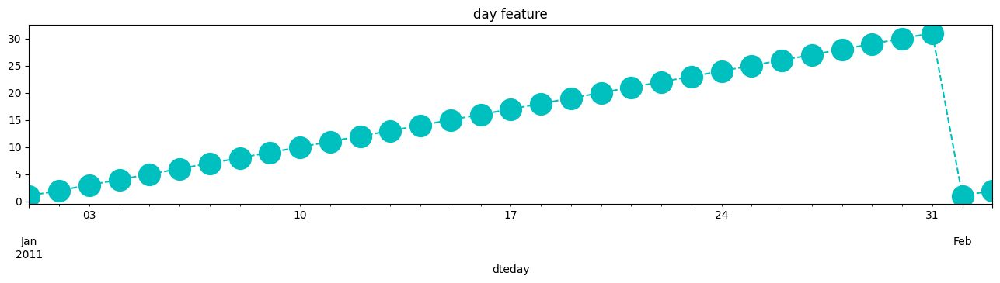

In [9]:
# Day feature shows whether it is a start of the month or the end of the month (1 to 30 or 31).
plt.figure(figsize=(16,3))
df['day'][:33].plot(linestyle='--', marker='o', color='c', ms=20, title='day feature')
plt.show()

## Workingday feature is a boolean. 

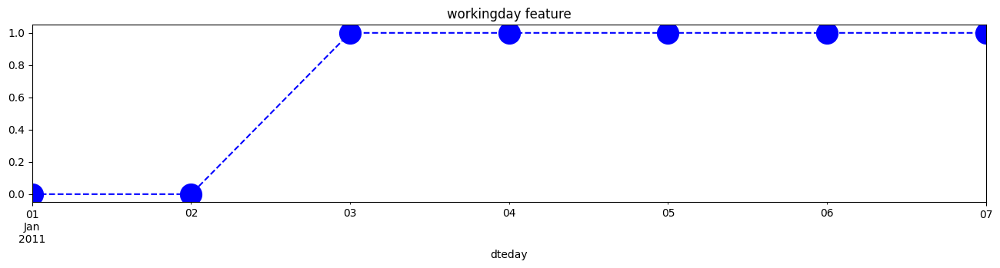

In [10]:
plt.figure(figsize=(16,3))
df['workingday'][:7].plot(linestyle='--', marker='o', color='b', ms=20, title='workingday feature')
plt.show()

## Note that season 1 indicates winter.

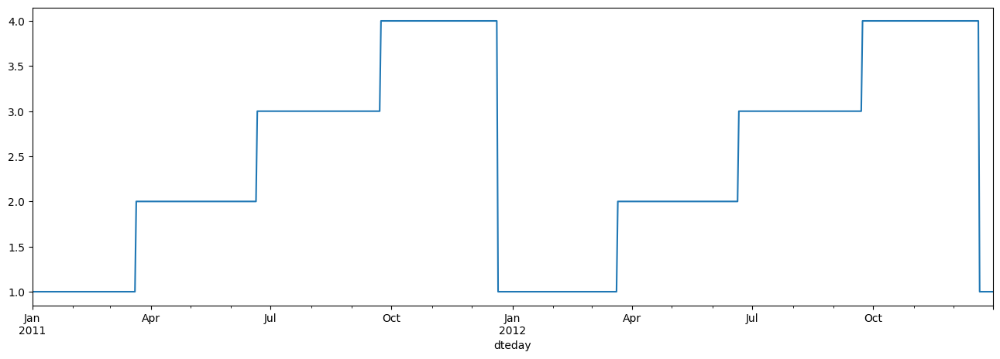

In [11]:
plt.figure(figsize=(16,5))
df['season'].plot()
plt.show()

In [12]:
df.season.value_counts()

3    188
2    184
1    181
4    178
Name: season, dtype: int64

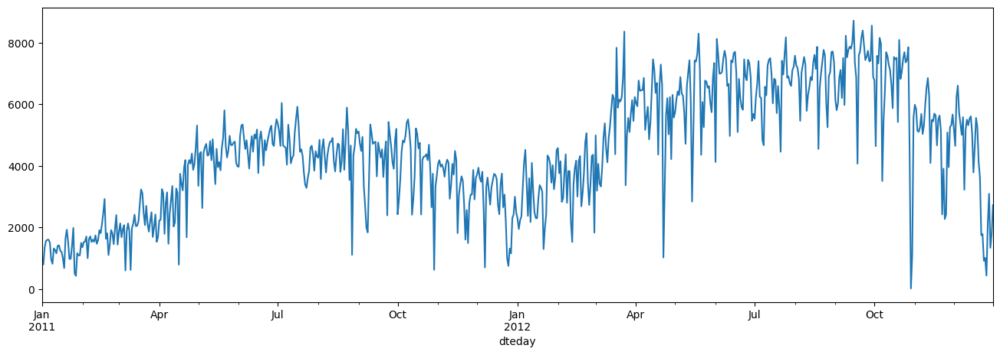

In [13]:
plt.figure(figsize=(16,5))
df['cnt'].plot()
plt.show()

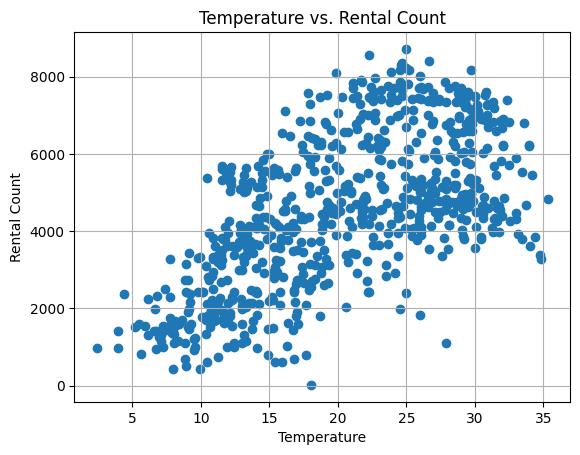

In [14]:
plt.scatter(x=df.temp*41,y=df["cnt"]) # denormalize temperature by multiplying 41
plt.grid(True)
plt.xlabel('Temperature')
plt.ylabel('Rental Count')
plt.title('Temperature vs. Rental Count')
plt.show()

Text(0.5, 1.0, 'Average Rental Count by Month')

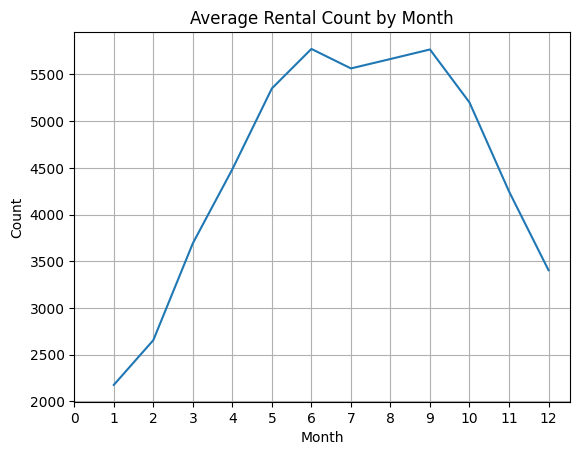

In [15]:
# from January to April, the demand is relatively low due to Winter 
#(there are not a lot of people that's brave enough to bike on icy road, are there?). 
# And the peak demand happends around Summer time (from May to October) and drop again.
group_month = df.groupby(['month'])
average_by_month = group_month['cnt'].mean()

plt.plot(average_by_month.index,average_by_month)
plt.xlabel('Month')
plt.ylabel('Count')
plt.xticks(np.arange(13))
plt.grid(True)
plt.title('Average Rental Count by Month')

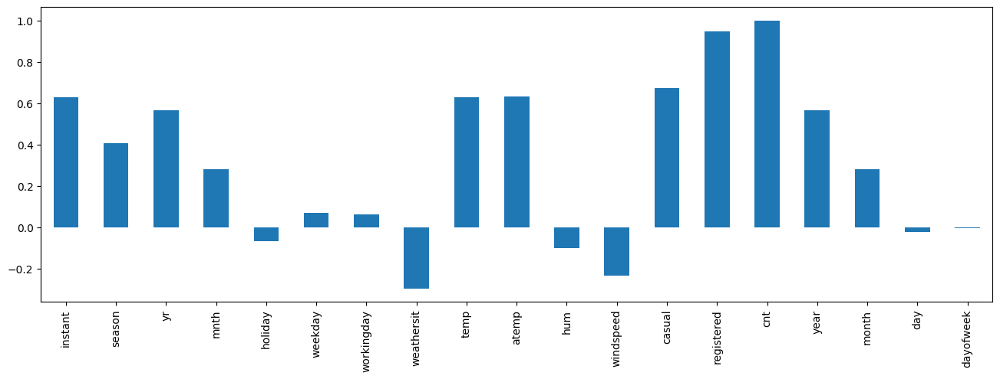

In [16]:
#correlation of total cnt with other variables
plt.figure(figsize=(16,5))
df.corr()['cnt'].plot(kind='bar')
plt.show()

In [17]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,731.0,366.000000,211.165812,1.000000,183.500000,366.000000,548.500000,731.000000
season,731.0,2.496580,1.110807,1.000000,2.000000,3.000000,3.000000,4.000000
yr,731.0,0.500684,0.500342,0.000000,0.000000,1.000000,1.000000,1.000000
mnth,731.0,6.519836,3.451913,1.000000,4.000000,7.000000,10.000000,12.000000
holiday,731.0,0.028728,0.167155,0.000000,0.000000,0.000000,0.000000,1.000000
weekday,731.0,2.997264,2.004787,0.000000,1.000000,3.000000,5.000000,6.000000
workingday,731.0,0.683995,0.465233,0.000000,0.000000,1.000000,1.000000,1.000000
weathersit,731.0,1.395349,0.544894,1.000000,1.000000,1.000000,2.000000,3.000000
temp,731.0,0.495385,0.183051,0.059130,0.337083,0.498333,0.655417,0.861667
atemp,731.0,0.474354,0.162961,0.079070,0.337842,0.486733,0.608602,0.840896


In [18]:
df.dtypes

instant         int64
season          int64
yr              int64
mnth            int64
holiday         int64
weekday         int64
workingday      int64
weathersit      int64
temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
year            int64
month           int64
day             int64
dayofweek       int64
dtype: object

# Data cleaning

# Categorical variables

Perform one hot encoding on categorical variables. Machine learning algorithms assume (and require) the data to be numeric, so the categorical data must be pre-processed as a numerical data.  Categorical variables turn into binary features that are 'one hot' encoded, so if a feature is represented by that column, it receives a 1, otherwise a 0.

- The 'season' feature has 1: winter, 2: spring, 3: summer, 4: fall. 
- The 'holiday' and 'workingday' features are boolean: 1 when it is a holiday. 1 when it is a working day.

In [19]:
# Define the categorical variables
cat_var = ['season', 'holiday', 'workingday', 'weathersit', 'year']

In [20]:
# OneHotEncoder
ohe = OneHotEncoder(categories = 'auto')

In [21]:
# Fit the categorical variables to the encoder
encodeddf = ohe.fit_transform(df[cat_var])

In [24]:
# Create a DataFrame with the encoded value information
cat_df = pd.DataFrame(data = encodeddf.toarray(), columns = ohe.get_feature_names_out(cat_var))
cat_df

,season_1,season_2,season_3,season_4,holiday_0,holiday_1,workingday_0,workingday_1,weathersit_1,weathersit_2,weathersit_3,year_2011,year_2012
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
727,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
728,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
729,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0


In [25]:
# rename the column names from 1,2,3,4 to spring, summer, fall, winter
cat_df.rename(columns={'season_1': 'winter', 'season_2': 'spring', 'season_3': 'summer', 'season_4': 'fall'}, inplace=True)
cat_df.rename(columns={'weathersit_1': 'clear', 'weathersit_2': 'cloudy', 'weathersit_3': 'lightsnow.rain'}, inplace=True)
cat_df

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
727,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
728,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
729,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0


# Numerical variables

Machine learning is sensitive to the relative scales of numerical variables. The range of all variables need to be normalized so that each feature contributes approximately proportionately to the calculation.

In [26]:
# Define the numerical variables
num_var = ['temp', 'atemp', 'hum', 'windspeed', 'month', 'day', 'dayofweek']       

Create standardized, normalized

In [27]:
# StandardScaler object
scaler = StandardScaler()

In [28]:
# Fit the data to the scaler
numscaled = scaler.fit_transform(df[num_var])

Keep the original for later view

In [29]:
# for inverse transformation
inversed = scaler.inverse_transform(numscaled)
print(inversed)

[[ 0.344167  0.363625  0.805833 ...  1.        1.        5.      ]
 [ 0.363478  0.353739  0.696087 ...  1.        2.        6.      ]
 [ 0.196364  0.189405  0.437273 ...  1.        3.        0.      ]
 ...
 [ 0.253333  0.2424    0.752917 ... 12.       29.        5.      ]
 [ 0.255833  0.2317    0.483333 ... 12.       30.        6.      ]
 [ 0.215833  0.223487  0.5775   ... 12.       31.        0.      ]]


In [30]:
# Create DataFrame with original data
inversed_df = pd.DataFrame(data = inversed, columns = num_var)
inversed_df

# Calculate based on UCI info to retrieve the actual temperature and weather information
#temp : Normalized temperature in Celsius. The values are divided to 41 (max)
#atemp: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
#hum: Normalized humidity. The values are divided to 100 (max)
#windspeed: Normalized wind speed. The values are divided to 67 (max)
inversed_origin = pd.concat([inversed_df.iloc[:,0] * 41, #temperature
           inversed_df.iloc[:,1] * 50,                   #feeling temperature
           inversed_df.iloc[:,2] * 100,                  #humidity
           inversed_df.iloc[:,3] * 67],                  #wind speed
          axis=1)
inversed_origin

,temp,atemp,hum,windspeed
0,14.110847,18.18125,80.5833,10.749882
1,14.902598,17.68695,69.6087,16.652113
2,8.050924,9.47025,43.7273,16.636703
3,8.200000,10.60610,59.0435,10.739832
4,9.305237,11.46350,43.6957,12.522300
...,...,...,...,...
726,10.420847,11.33210,65.2917,23.458911
727,10.386653,12.75230,59.0000,10.416557
728,10.386653,12.12000,75.2917,8.333661
729,10.489153,11.58500,48.3333,23.500518


<AxesSubplot: >

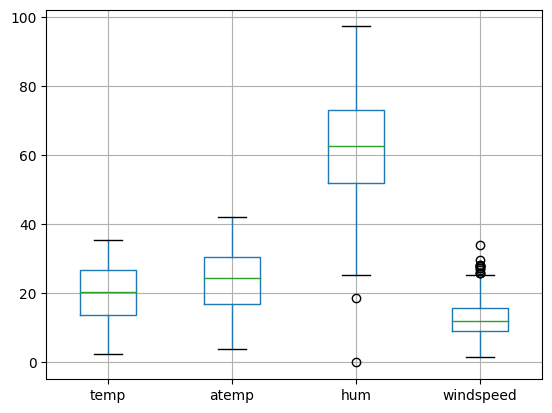

In [31]:
# Units are different but still can review the distribution
inversed_origin.boxplot()

Text(0.5, 0, 'daily time (# rows)')

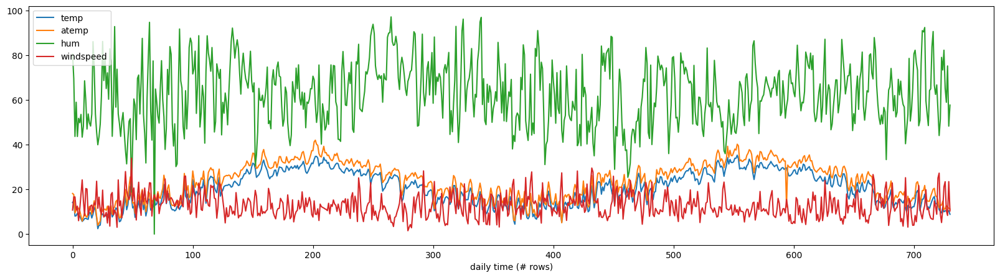

In [32]:
# Time series of the four features
ax = inversed_origin.set_index(inversed_origin.index).plot(figsize=(20,5))
ax.set_xlabel('daily time (# rows)')

In [33]:
X_original = pd.concat([cat_df, inversed_origin, inversed_df[['month', 'day', 'dayofweek']]], axis=1)
X_original # Use this for SHAP plot view

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,14.110847,18.18125,80.5833,10.749882,1.0,1.0,5.0
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,14.902598,17.68695,69.6087,16.652113,1.0,2.0,6.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,8.050924,9.47025,43.7273,16.636703,1.0,3.0,0.0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,8.200000,10.60610,59.0435,10.739832,1.0,4.0,1.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,9.305237,11.46350,43.6957,12.522300,1.0,5.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,10.420847,11.33210,65.2917,23.458911,12.0,27.0,3.0
727,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,10.386653,12.75230,59.0000,10.416557,12.0,28.0,4.0
728,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,10.386653,12.12000,75.2917,8.333661,12.0,29.0,5.0
729,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,10.489153,11.58500,48.3333,23.500518,12.0,30.0,6.0


In [34]:
# Create DataFrame with numerically scaled data
num_df = pd.DataFrame(data = numscaled, columns = num_var)
num_df

,temp,atemp,hum,windspeed,month,day,dayofweek
0,-0.826662,-0.679946,1.250171,-0.387892,-1.600161,-1.674108,0.996930
1,-0.721095,-0.740652,0.479113,0.749602,-1.600161,-1.560522,1.496077
2,-1.634657,-1.749767,-1.339274,0.746632,-1.600161,-1.446936,-1.498809
3,-1.614780,-1.610270,-0.263182,-0.389829,-1.600161,-1.333351,-0.999661
4,-1.467414,-1.504971,-1.341494,-0.046307,-1.600161,-1.219765,-0.500513
...,...,...,...,...,...,...,...
726,-1.318665,-1.521108,0.175807,2.061426,1.588660,1.279122,-0.001366
727,-1.323224,-1.346690,-0.266238,-0.452131,1.588660,1.392707,0.497782
728,-1.323224,-1.424344,0.878392,-0.853552,1.588660,1.506293,0.996930
729,-1.309558,-1.490049,-1.015664,2.069444,1.588660,1.619879,1.496077


Define X (input): Concatenate one hot encoded categorical + normalized numerical data

In [35]:
# Xdf: normalized
Xdf = pd.concat([cat_df, num_df], axis = 1)
Xdf.head(5)

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,-0.826662,-0.679946,1.250171,-0.387892,-1.600161,-1.674108,0.996930
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,-0.721095,-0.740652,0.479113,0.749602,-1.600161,-1.560522,1.496077
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,-1.634657,-1.749767,-1.339274,0.746632,-1.600161,-1.446936,-1.498809
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,-1.614780,-1.610270,-0.263182,-0.389829,-1.600161,-1.333351,-0.999661
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,-1.467414,-1.504971,-1.341494,-0.046307,-1.600161,-1.219765,-0.500513


In [36]:
# Save column names for SHAP usage
NAMES = Xdf.columns
NAMES

Index(['winter', 'spring', 'summer', 'fall', 'holiday_0', 'holiday_1',
       'workingday_0', 'workingday_1', 'clear', 'cloudy', 'lightsnow.rain',
       'year_2011', 'year_2012', 'temp', 'atemp', 'hum', 'windspeed', 'month',
       'day', 'dayofweek'],
      dtype='object')

<AxesSubplot: >

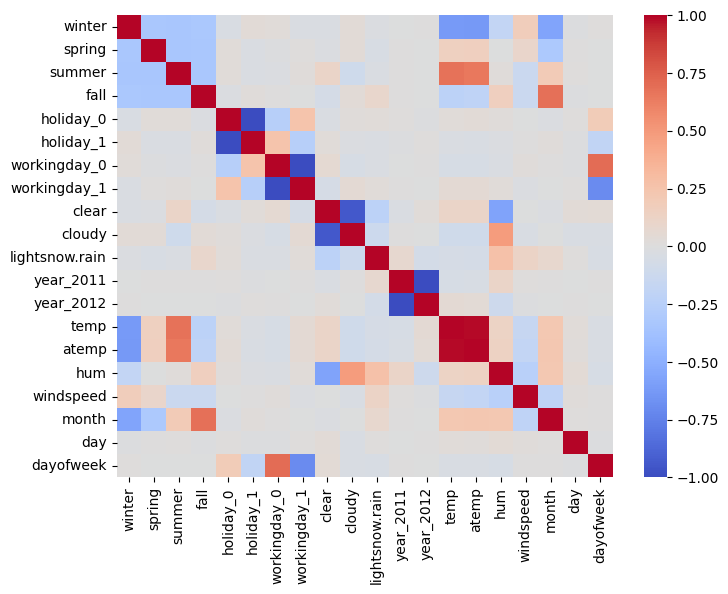

In [37]:
plt.subplots(figsize=(8, 6))
sb.heatmap(Xdf.corr(), cmap='coolwarm')

In [38]:
# Check if there is any non available
Xdf.isna().any().sum()

0

Define Y (to predict): Extract target

In [39]:
# Here, indicate which target to predict (cnt or casual or registered) 
to_predict = 'cnt'

In [40]:
# Here, indicate which target to predict (cnt or casual or registered) 
y = df[to_predict]

# Normalize target data: Calculate mean and standard deviation
y_mu = y.mean(0)
y_sd = y.std(0)

print('y mean:', y_mu, ' y std:' , y_sd)

y_norm = (y - y_mu) / y_sd
y_norm = y_norm.values.ravel() #dataframe to 1D array
#y_norm

y mean: 4504.3488372093025  y std: 1937.2114516187676


Split training and test data

In [41]:
np.random.seed(1234)
# Split the data into training, validation, and test data:
X_train, X_test, y_train, y_test = train_test_split(Xdf, y_norm, test_size = 0.2, random_state=1)
# Validation set
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=1) 

# Grid search and modeling

In [42]:
# A parameter grid for XGBoost
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

In [43]:
# Build the model with 
# XGBoost Training Parameter Reference: 
#   https://github.com/dmlc/xgboost
#   https://xgboost.readthedocs.io/en/latest/parameter.html

# XGBRegressor object and GridSearch object
xgbmodel = xgb.XGBRegressor() 
clf = GridSearchCV(estimator = xgbmodel,
                   param_grid = params,
                   cv = 3,
                   verbose=1)

In [44]:
# Fit the training data to the GridSearch object
t0 = time.time()
clf.fit(X_train, y_train)
t1 = time.time()
print(t1-t0, " sec taken")

Fitting 3 folds for each of 405 candidates, totalling 1215 fits


85.05309343338013  sec taken


In [45]:
# Display the best parameters from the GridSearch
print(clf.best_params_)
print(clf.best_score_)

{'colsample_bytree': 0.8, 'gamma': 0.5, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.8}
0.8633448414950647


# Train with best parameters

In [46]:
from sklearn._config import get_config, set_config
set_config(print_changed_only=False)

In [47]:
xgbmodel = xgb.XGBRegressor(**clf.best_params_, random_state=0)

In [48]:
# Fit the training data to the model
xgbmodel.fit(X_train, y_train, eval_set = [(X_train, y_train), (X_val, y_val)])

[0]	validation_0-rmse:0.84811	validation_1-rmse:0.86342
[1]	validation_0-rmse:0.67246	validation_1-rmse:0.69370
[2]	validation_0-rmse:0.54534	validation_1-rmse:0.58267
[3]	validation_0-rmse:0.45971	validation_1-rmse:0.50922
[4]	validation_0-rmse:0.40182	validation_1-rmse:0.45342
[5]	validation_0-rmse:0.36729	validation_1-rmse:0.40947
[6]	validation_0-rmse:0.33601	validation_1-rmse:0.38506
[7]	validation_0-rmse:0.31756	validation_1-rmse:0.37200
[8]	validation_0-rmse:0.30014	validation_1-rmse:0.36170
[9]	validation_0-rmse:0.28967	validation_1-rmse:0.35561
[10]	validation_0-rmse:0.28115	validation_1-rmse:0.34970
[11]	validation_0-rmse:0.27210	validation_1-rmse:0.34349
[12]	validation_0-rmse:0.27027	validation_1-rmse:0.33654
[13]	validation_0-rmse:0.26416	validation_1-rmse:0.33288
[14]	validation_0-rmse:0.25919	validation_1-rmse:0.33080
[15]	validation_0-rmse:0.25919	validation_1-rmse:0.33081
[16]	validation_0-rmse:0.25706	validation_1-rmse:0.32948
[17]	validation_0-rmse:0.25709	validation

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.5, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=5, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             objective='reg:squarederror', predictor=None, ...)

# Predict

In [49]:
eval_result = xgbmodel.evals_result()
training_rounds = range(len(eval_result['validation_0']['rmse'])) #training
print(training_rounds)

range(0, 100)


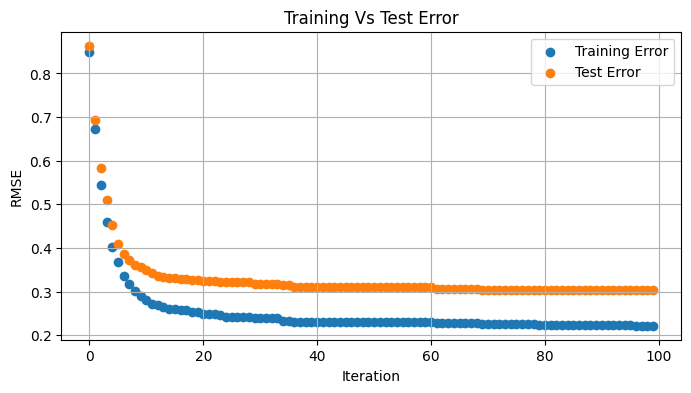

In [50]:
plt.figure(figsize=(8,4))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Test Error')
plt.grid(True)
plt.xlabel('Iteration')
plt.ylabel('RMSE')
plt.title('Training Vs Test Error')
plt.legend()
plt.show()

In [51]:
ypredicted = xgbmodel.predict(X_test) 

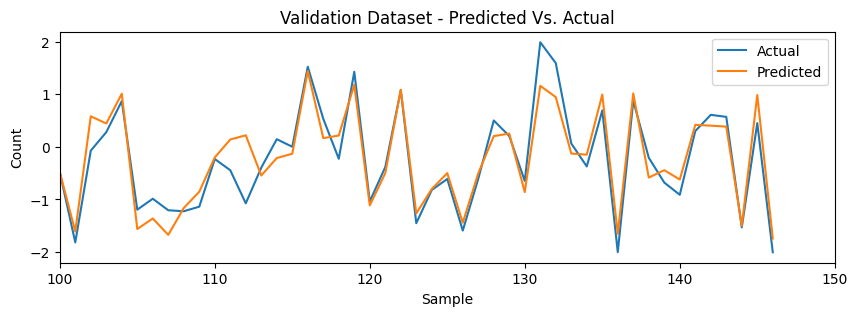

In [52]:
plt.figure(figsize=(10,3))
# Actual Vs Predicted
plt.plot(y_test, label='Actual')
plt.plot(ypredicted, label='Predicted')
plt.xlabel('Sample')
plt.ylabel('Count')
plt.xlim([100,150])
plt.title('Validation Dataset - Predicted Vs. Actual')
plt.legend()
plt.show()

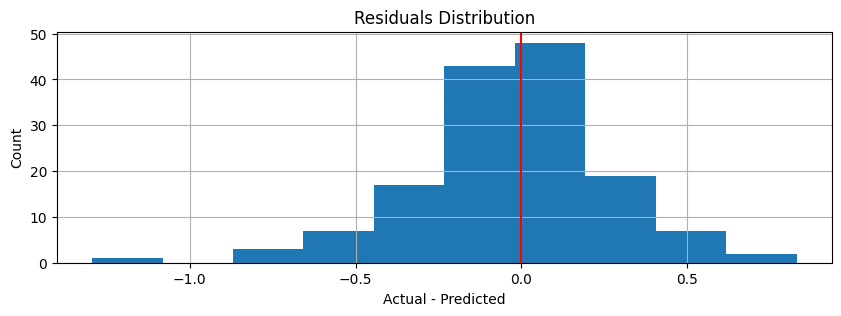

In [53]:
# Over prediction and Under Prediction needs to be balanced
# Training Data Residuals
residuals = (y_test - ypredicted) # * y_sd + y_mu (for actual cnt numbers)

plt.figure(figsize=(10,3))
plt.hist(residuals)
plt.grid(True)
plt.xlabel('Actual - Predicted')
plt.ylabel('Count')
plt.title('Residuals Distribution')
plt.axvline(color='r')
plt.show()

In [54]:
print("RMSE: {0:0.4f}".format(mean_squared_error(y_test, ypredicted)))

RMSE: 0.0884


In [55]:
# Show the influencing features in order (with feature_importances_)
# Indicate which parameter used to decide the ranking of important features
important_features = pd.Series(data=xgbmodel.feature_importances_, index=NAMES)
important_features.sort_values(ascending=False,inplace=True)
print(important_features)

# There are different parameters:
# Refer to, https://github.com/dmlc/xgboost/blob/master/python-package/xgboost/core.py
#        * 'weight': the number of times a feature is used to split the data across all trees.
#        * 'gain': the average gain across all splits the feature is used in.
#        * 'cover': the average coverage across all splits the feature is used in.
#        * 'total_gain': the total gain across all splits the feature is used in.
#        * 'total_cover': the total coverage across all splits the feature is used in.

year_2012         0.334441
month             0.148238
year_2011         0.093973
atemp             0.091646
winter            0.060549
fall              0.057606
clear             0.034687
cloudy            0.033488
temp              0.031691
lightsnow.rain    0.028922
hum               0.022926
windspeed         0.017095
workingday_0      0.010901
holiday_0         0.009047
day               0.007691
dayofweek         0.007369
workingday_1      0.007166
spring            0.002563
holiday_1         0.000000
summer            0.000000
dtype: float32


In [56]:
important_features = pd.Series(data=xgbmodel.get_booster().get_score(importance_type='gain'), index=NAMES)
important_features.sort_values(ascending=False,inplace=True)
print(important_features)

year_2012         24.965616
month             11.065815
year_2011          7.015013
atemp              6.841238
winter             4.519948
fall               4.300218
clear              2.589336
cloudy             2.499859
temp               2.365730
lightsnow.rain     2.159016
hum                1.711424
windspeed          1.276122
workingday_0       0.813745
holiday_0          0.675331
day                0.574106
dayofweek          0.550102
workingday_1       0.534939
spring             0.191319
summer                  NaN
holiday_1               NaN
dtype: float64


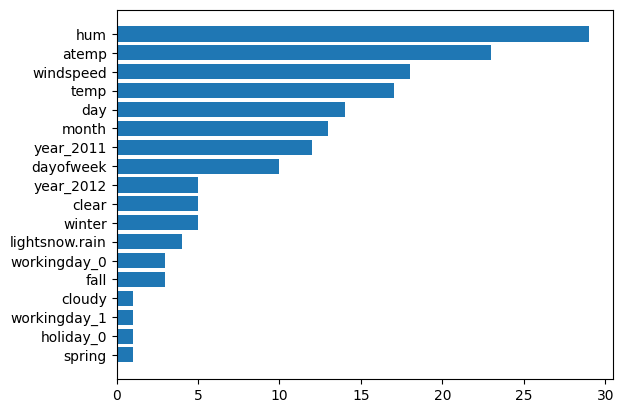

In [57]:
# Show the influencing features in order (with get_booster().get_fscore())
# fscore is based on the number of times a feature is used in a tree
fscore = xgbmodel.get_booster().get_fscore().items()
lists = sorted(fscore, key=lambda x:x[1]) # sorted by value, return a list of tuples
fkey, fvalue = zip(*lists) # unpack a list of pairs into two tuples

plt.barh(fkey, fvalue)
plt.show()

# Check which single instance to compare with SHAP

In [58]:
# Select from the test set
# when atemp Low/hum Higher[301]:cnt627  
test = X_test[ (X_test['atemp'] < -1) & (X_test['hum'] > 1)]
print(test.shape)
test.head(5)

(2, 20)


,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
35,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,-1.432558,-1.420304,2.116697,-0.379718,-1.310268,-1.219765,0.99693
301,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,-1.318665,-1.513304,1.788822,2.077411,1.008875,1.506293,0.99693


In [59]:
PICK = 301 #atempLow/humHigher[301]:cnt627      
Xdf[Xdf.index==PICK]

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
301,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,-1.318665,-1.513304,1.788822,2.077411,1.008875,1.506293,0.99693


In [60]:
# review the target values, y[301] has target cnt = 627 which is a very low bike rental count
print("target count is:", y[301])

target count is: 627


In [61]:
# For comparison, keep the indices that were used for SHAP cases
SAMPLE1 = 364 #winter, weekend day (from test)
SAMPLE2 = 180 #summer, working day (from test)

# Select one day for investigation with a force plot later
weekEnd_sample = Xdf.loc[[SAMPLE1]]   #winter, weekend day (from test)
weekDay_sample = Xdf.loc[[SAMPLE2]]   #summer, working day (from test)

weekEnd_sample_origin = X_original.loc[[SAMPLE1]]
weekDay_sample_origin = X_original.loc[[SAMPLE2]]
weekEnd_sample 

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
364,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,-0.466773,-0.369869,-0.084739,0.383083,1.58866,1.733465,0.99693


# Explain model with LIME

In [62]:
X_original.head(5)

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,14.110847,18.18125,80.5833,10.749882,1.0,1.0,5.0
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,14.902598,17.68695,69.6087,16.652113,1.0,2.0,6.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,8.050924,9.47025,43.7273,16.636703,1.0,3.0,0.0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,8.200000,10.60610,59.0435,10.739832,1.0,4.0,1.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,9.305237,11.46350,43.6957,12.522300,1.0,5.0,2.0


In [63]:
# let the LIME Explainer know which features are categorical
categorical_features = [0,1,2,3,4,5,6,7,8,9,10,11,12]

In [64]:
categorical_names = {}
for feature in categorical_features:    
    le = LabelEncoder()
    le.fit(Xdf.iloc[:, feature])
    categorical_names[feature] = le.classes_

In [65]:
# Initialize the explainer
# Note that this is a regression problem, not a classification
explainer = LimeTabularExplainer(X_train.values, feature_names=NAMES,
                                  categorical_features=categorical_features, 
                                  categorical_names=categorical_names,
                                  verbose=True, mode='regression')

# LIME Local explanation (one day)

In [66]:
print("winter, weekend day target count:", y[SAMPLE1])
print("summer, working day target count:", y[SAMPLE2])

winter, weekend day target count: 2485
summer, working day target count: 5515


,cnt
count,731.000000
mean,4504.348837
std,1937.211452
min,22.000000
25%,3152.000000
50%,4548.000000
75%,5956.000000
max,8714.000000


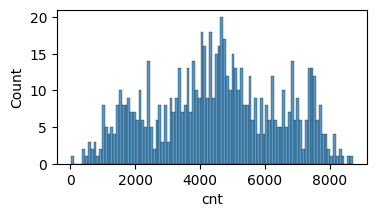

In [67]:
plt.figure(figsize=(4,2))
ax = sb.histplot(data=df, x="cnt", bins=100)
pd.DataFrame((df['cnt']).describe())

# Explain this one day: Weekend, Winter

In [68]:
weekEnd_sample_origin

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
364,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,16.81,20.70605,61.5833,14.750318,12.0,31.0,5.0


In [69]:
# Explain one day: Weekend
# winter, weekend day target count: 2485
print("WEEKEND in Winter")
#Explanation object has information about features contributions to this particular prediction
exp_WE = explainer.explain_instance(weekEnd_sample.values[0], xgbmodel.predict, num_features=10)
exp_WE.show_in_notebook(show_all=False)

WEEKEND in Winter
Intercept -0.13717358059366633
Prediction_local [-0.57309594]
Right: -0.6958025


# Explanation
Based on the local model, the prediction value showed -0.597 while the actual model predicted -0.696, which is aligned and shows a negative rent prediction on this day.

The renting prediction is negatively affected by the year 2011 feature. Being winter and having a lower feeling temperature affect the rent prediction negatively.

Having no light snow or rain, low humidity, and clear skies raise the rent prediction, but not enough to push the scales toward positive.


In [70]:
# Explain one day: Weekend
# winter, weekend day target count: 2485
print("WEEKEND in Winter (restrict to 5 features)")
#Explanation object has information about features contributions to this particular prediction
exp_WE = explainer.explain_instance(weekEnd_sample.values[0], xgbmodel.predict, num_features=5)
exp_WE.show_in_notebook(show_all=False) 

WEEKEND in Winter (restrict to 5 features)
Intercept 0.26500944484935046
Prediction_local [-0.52061615]
Right: -0.6958025


In [71]:
# Feature-Contribution mapping
pd.DataFrame(exp_WE.as_list(),columns=['Feature','Contribution'])

,Feature,Contribution
0,year_2011=1.0,-0.520235
1,year_2012=0.0,-0.421981
2,winter=1.0,-0.212996
3,-0.73 < hum <= 0.04,0.195789
4,clear=1.0,0.173798


In [72]:
# same with LIME plot
#with plt.style.context("ggplot"):
#    exp_WE.as_pyplot_figure()

# Explain this one day: Weekday, Summer

In [73]:
# Change input to another day for local explanation: Weekday
#Explanation object has information about features contributions to this particular prediction
# summer, working day target count: 5515
print("WEEKDAY in Summer")
exp_wd = explainer.explain_instance(weekDay_sample.values[0], xgbmodel.predict, num_features=25)
exp_wd.show_in_notebook(show_all=False) 

WEEKDAY in Summer
Intercept -0.34924014881796034
Prediction_local [0.09830227]
Right: 0.22199456


In [74]:
# Note that the LIME prediction has changed with 5 features input in this case
# summer, working day target count: 5515
print("WEEKDAY in Summer (restrict to 5 features)")
exp_wd = explainer.explain_instance(weekDay_sample.values[0], xgbmodel.predict, num_features=5)
exp_wd.show_in_notebook(show_all=False) 

WEEKDAY in Summer (restrict to 5 features)
Intercept 0.16906834849247088
Prediction_local [-0.20076617]
Right: 0.22199456


In [75]:
pd.DataFrame(exp_wd.as_list(),columns=['Feature','Contribution'])

,Feature,Contribution
0,year_2011=1.0,-0.524257
1,year_2012=0.0,-0.435940
2,hum <= -0.73,0.214068
3,atemp > 0.82,0.191429
4,clear=1.0,0.184865


In [76]:
# how to get LIME Prediction value
exp_wd.intercept[1] + pd.DataFrame(exp_wd.as_list())[1].sum()

-0.20076616629950328

# Explore the relationship between atemp and humidity (compare w SHAP)

In [77]:
# Select one day for investigation
aL_hH = Xdf.loc[[301]] #atempLow/humHigher[301]:cnt627      
aL_hL = Xdf.loc[[368]] #atempLow/humLower[368]:cnt2368      
aH_hL = Xdf.loc[[551]] #atempHigh/humLower[551]:cnt6241      
aH_hA = Xdf.loc[[584]] #atempHigh/humAvg[584]:cnt7273      

aL_hH_origin = X_original.loc[[301]]
aL_hL_origin = X_original.loc[[368]]
aH_hL_origin = X_original.loc[[551]]
aH_hA_origin = X_original.loc[[584]]
aH_hA_origin

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
584,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,30.169153,34.88105,70.375,7.832836,8.0,7.0,1.0


In [78]:
#1 [301]
print("atemp Lower/ hum Higher")
exp_aL_hH = explainer.explain_instance(aL_hH.values[0], xgbmodel.predict, num_features=5)
exp_aL_hH.show_in_notebook(show_all=False) 
#2 [368]
print("atemp Lower/ hum Lower")
exp_aL_hL = explainer.explain_instance(aL_hL.values[0], xgbmodel.predict, num_features=5)
exp_aL_hL.show_in_notebook(show_all=False) 
#3 [551]
print("atemp Higher/ hum Lower")
exp_aH_hL = explainer.explain_instance(aH_hL.values[0], xgbmodel.predict, num_features=5)
exp_aH_hL.show_in_notebook(show_all=False) 
#4 [584]
print("atemp Higher/ hum Average")
exp_aH_hA = explainer.explain_instance(aH_hA.values[0], xgbmodel.predict, num_features=5)
exp_aH_hA.show_in_notebook(show_all=False) 


atemp Lower/ hum Higher


Intercept 0.6834259351334523
Prediction_local [-1.49897929]
Right: -1.6550077


atemp Lower/ hum Lower
Intercept -0.26916617732582204
Prediction_local [-0.46064575]
Right: -0.8665453


atemp Higher/ hum Lower
Intercept -0.8553477926513701
Prediction_local [0.81260366]
Right: 0.89202654


atemp Higher/ hum Average
Intercept -0.8617095307885088
Prediction_local [0.79119369]
Right: 1.1825035


# Check the distribution

In [79]:
# normalized vs original: distribution of humidity, normalized value and ignore scientific format
df_hat_n = pd.DataFrame(Xdf['hum'].describe().apply(lambda x: format(x, 'f')))
df_hat_n['atemp'] = Xdf['atemp'].describe().apply(lambda x: format(x, 'f'))
df_hat_n['temp'] = Xdf['temp'].describe().apply(lambda x: format(x, 'f'))

df_hat = pd.DataFrame((df['hum']*100).describe())
df_hat['atemp'] = ((df['atemp']*50).describe())
df_hat['temp'] = ((df['temp']*41).describe())

In [80]:
display(df_hat)
display(df_hat_n)

,hum,atemp,temp
count,731.000000,731.000000,731.000000
mean,62.789406,23.717699,20.310776
std,14.242910,8.148059,7.505091
min,0.000000,3.953480,2.424346
25%,52.000000,16.892125,13.820424
50%,62.666700,24.336650,20.431653
75%,73.020850,30.430100,26.872076
max,97.250000,42.044800,35.328347


,hum,atemp,temp
count,731.000000,731.000000,731.000000
mean,-0.000000,0.000000,-0.000000
std,1.000685,1.000685,1.000685
min,-4.411486,-2.427296,-2.384871
25%,-0.758047,-0.838267,-0.865385
50%,-0.008621,0.076015,0.016117
75%,0.718845,0.824368,0.874845
max,2.421148,2.250800,2.002355
